# Programming asignment 4

This assignment covers K-Means clustering for image segmentation problem.

In [1]:
from __future__ import print_function

#Setup

# The Random module might be used for pseudo-random number generators
import random 

# Numpy plays important role in scientific computing with Python, especially for coding vision algorithms. 
# This package will be one of our most used libraries in this class. Make sure you spend enough time for practicing it.
import numpy as np

# This module is used to measure the execution time of code sections  
from time import time

#This module is used to read and write image in various formats
from skimage import io

#Imports all the methods in the file segmentation.py
from segmentation import *

#Matplotlib is a useful plotting library for python 
import matplotlib.pyplot as plt

# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (20.0, 15.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading extenrnal modules
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

## Introduction
In this assignment, you will use clustering algorithms to segment images. You will then use these segmentations to identify foreground and background objects.

Your assignment will involve the following subtasks:
- **Clustering algorithms**: Implement K-Means clustering.
- **Pixel-level features**: Implement a feature vector that combines color and position information and implement feature normalization.
- **Quantitative Evaluation**: Evaluate segmentation algorithms with a variety of parameter settings by comparing your computed segmentations against a dataset of ground-truth segmentations.

## Part 1: Clustering Algorithms (3 points)

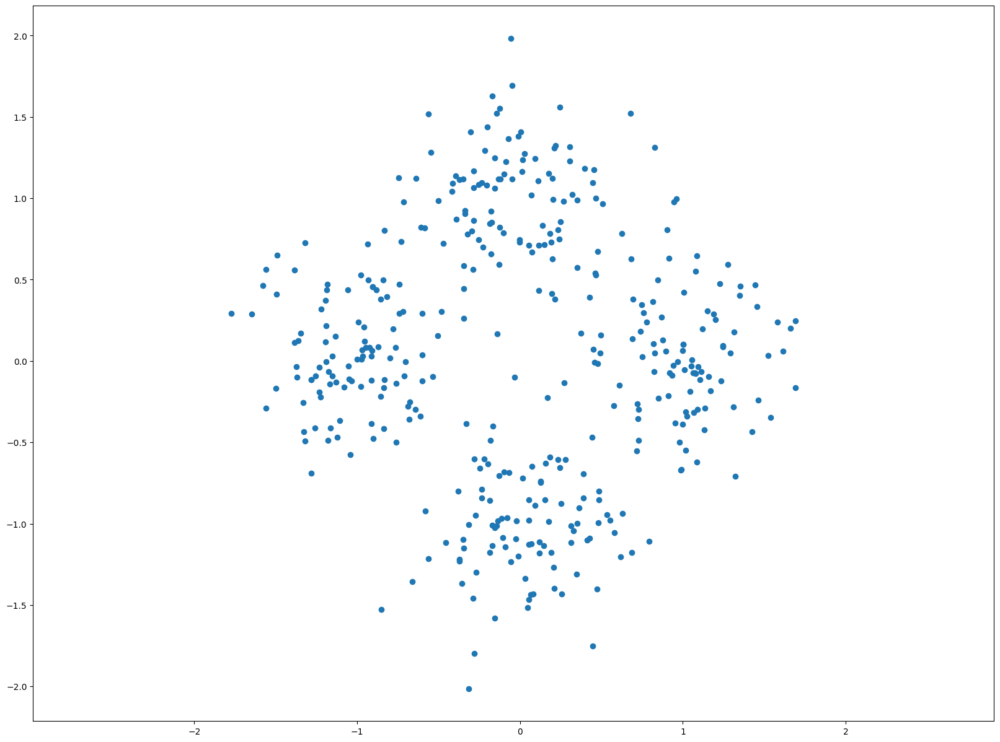

In [19]:
# Generate random data points for clustering

# Cluster 1
mean1 = [-1, 0]
cov1 = [[0.1, 0], [0, 0.1]]
X1 = np.random.multivariate_normal(mean1, cov1, 100)

# Cluster 2
mean2 = [0, 1]
cov2 = [[0.1, 0], [0, 0.1]]
X2 = np.random.multivariate_normal(mean2, cov2, 100)

# Cluster 3
mean3 = [1, 0]
cov3 = [[0.1, 0], [0, 0.1]]
X3 = np.random.multivariate_normal(mean3, cov3, 100)

# Cluster 4
mean4 = [0, -1]
cov4 = [[0.1, 0], [0, 0.1]]
X4 = np.random.multivariate_normal(mean4, cov4, 100)

# Merge sets of data points
X = np.concatenate((X1, X2, X3, X4))

# Plot data points
plt.scatter(X[:, 0], X[:, 1])
plt.axis('equal')
plt.show()

### 1.1 K-Means Clustering (1.5 points)
As discussed in the lecture, K-Means is one of the most popular clustering algorithms. You have been provided skeleton code for K-Means clustering in the file `segmentation.py`. Your first task is to finish implementing **`kmeans`** in `segmentation.py`. This naive version uses nested-for-loops to assign points to the closest centroid and compute new mean of each cluster.

kmeans running time: 0.019887 seconds.


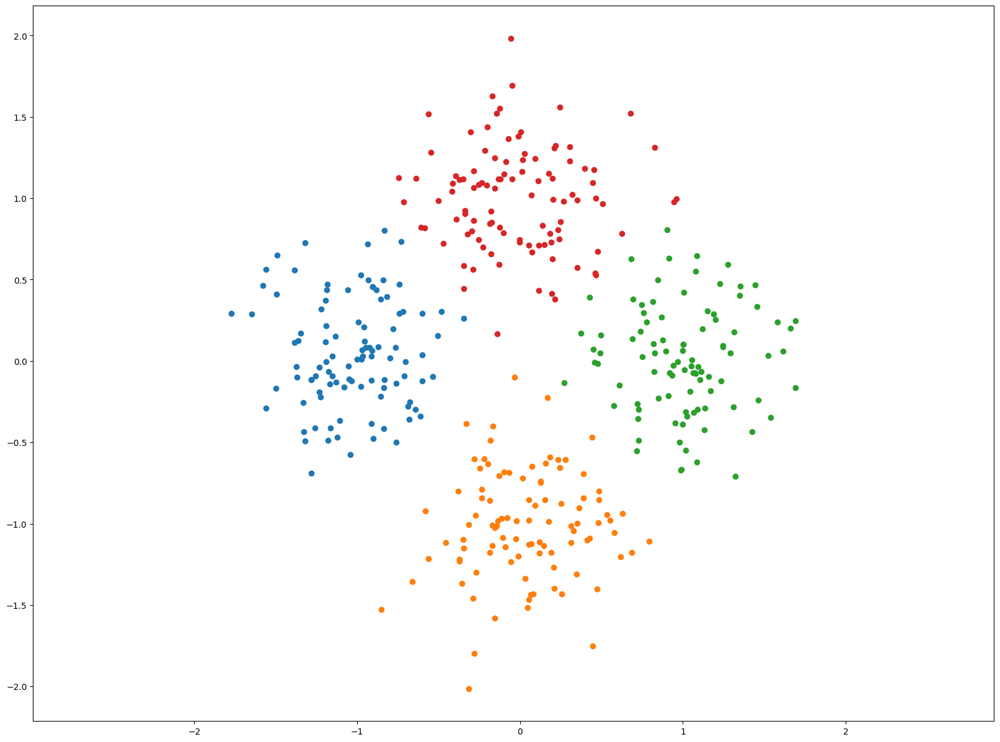

In [20]:
np.random.seed(0)
start = time()
assignments = kmeans(X, 4)
end = time()

kmeans_runtime = end - start

print("kmeans running time: %f seconds." % kmeans_runtime)

for i in range(4):
    cluster_i = X[assignments==i]
    plt.scatter(cluster_i[:, 0], cluster_i[:, 1])

plt.axis('equal')
plt.show()

### 1.2 Fast K-Means Clustering (1.5 points)
We can use vectorization and broadcasting with numpy functions to make kmeans faster. Implement **`kmeans_fast`** in `segmentation.py`. This should run around 10 times faster than the previous implementation of the simple loop version.

kmeans running time: 0.001143 seconds.
17.399249 times faster!


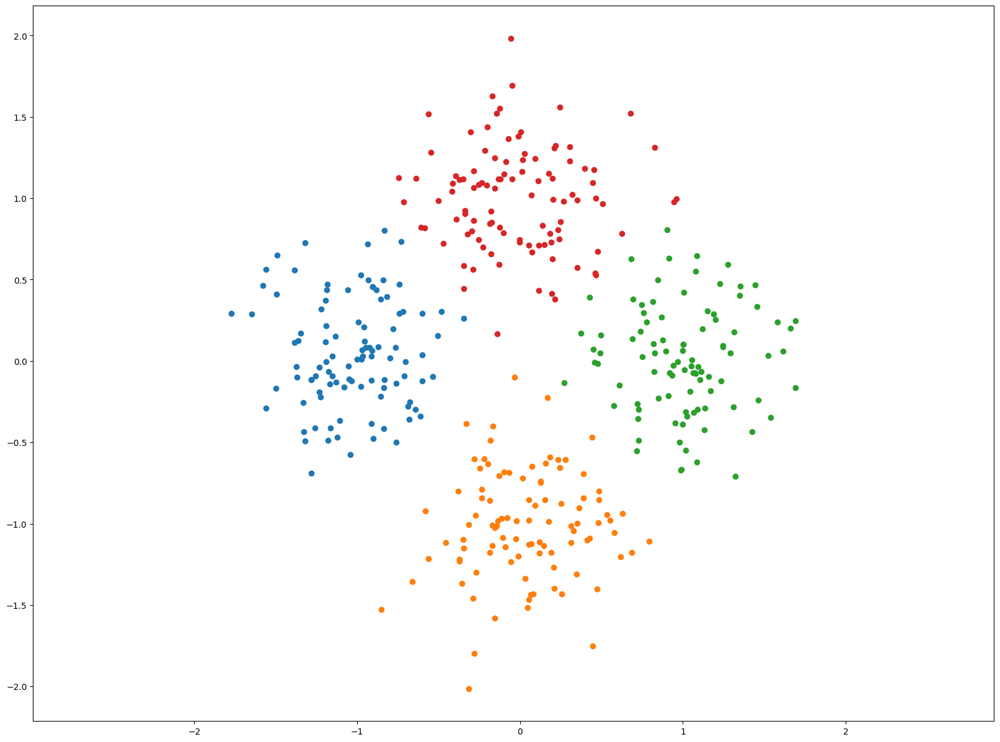

In [21]:
np.random.seed(0)
start = time()
assignments = kmeans_fast(X, 4)
end = time()

kmeans_fast_runtime = end - start
print("kmeans running time: %f seconds." % kmeans_fast_runtime)
print("%f times faster!" % (kmeans_runtime / kmeans_fast_runtime))

for i in range(4):
    cluster_i = X[assignments==i]
    plt.scatter(cluster_i[:, 0], cluster_i[:, 1])

plt.axis('equal')
plt.show()

## Part 2: Pixel-Level Features (1.5 points)
Before we can use a clustering algorithm to segment an image, we must compute some *feature vectore* for each pixel. The feature vector for each pixel should encode the qualities that we care about in a good segmentation. More concretely, for a pair of pixels $p_i$ and $p_j$ with corresponding feature vectors $f_i$ and $f_j$, the distance between $f_i$ and $f_j$ should be small if we believe that $p_i$ and $p_j$ should be placed in the same segment and large otherwise.

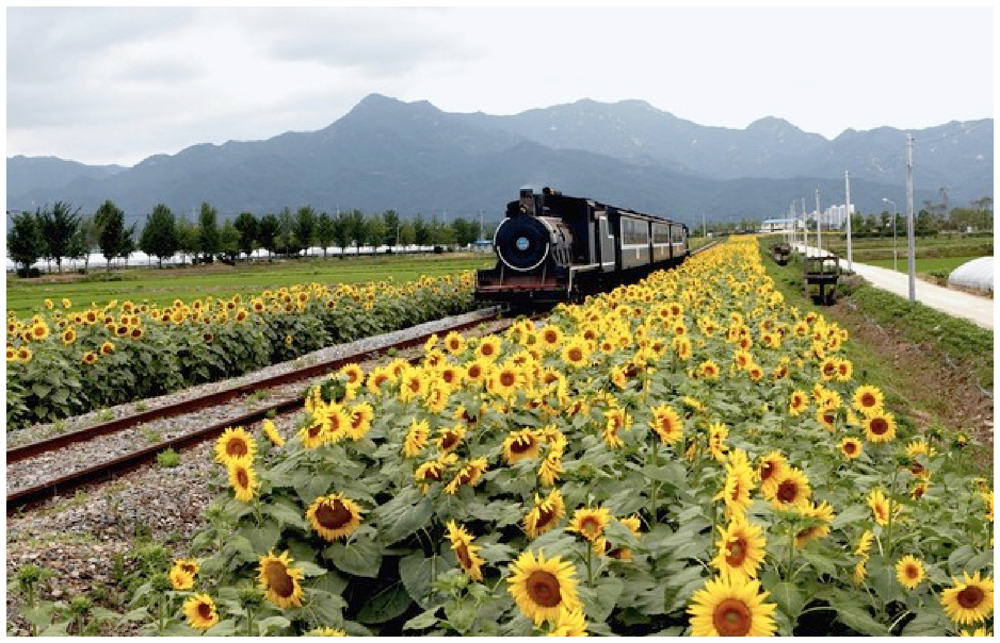

In [22]:
# Load and display image
img = io.imread('train.jpg')
H, W, C = img.shape

plt.imshow(img)
plt.axis('off')
plt.show()

### 2.1 Color Features (0.5 point)
One of the simplest possible feature vectors for a pixel is simply the vector of colors for that pixel. Implement **`color_features`** in `segmentation.py`. Output should look like the following:
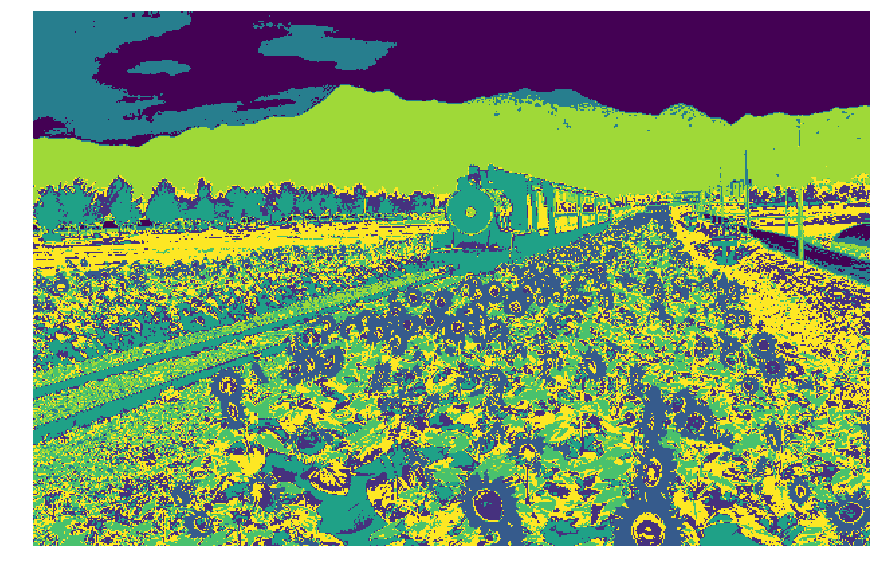

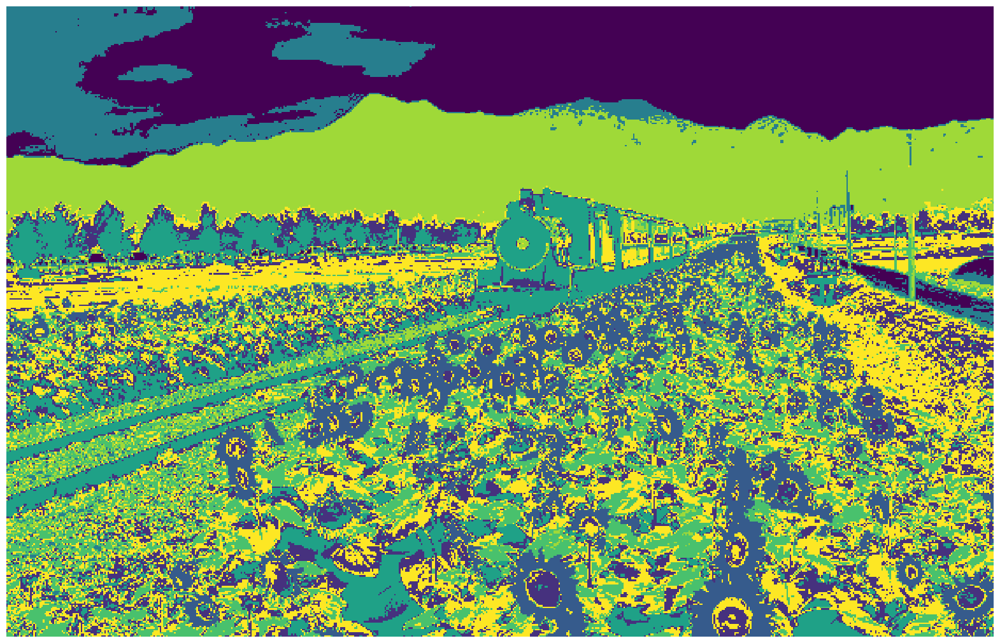

In [23]:
np.random.seed(0)

features = color_features(img)

# Sanity checks
assert features.shape == (H * W, C),\
    "Incorrect shape! Check your implementation."

assert features.dtype == np.float64,\
    "dtype of color_features should be float."

assignments = kmeans_fast(features, 8)
segments = assignments.reshape((H, W))

# Display segmentation
plt.imshow(segments, cmap='viridis')
plt.axis('off')
plt.show()

In the cell below, we visualize each segment as the mean color of pixels in the segment.

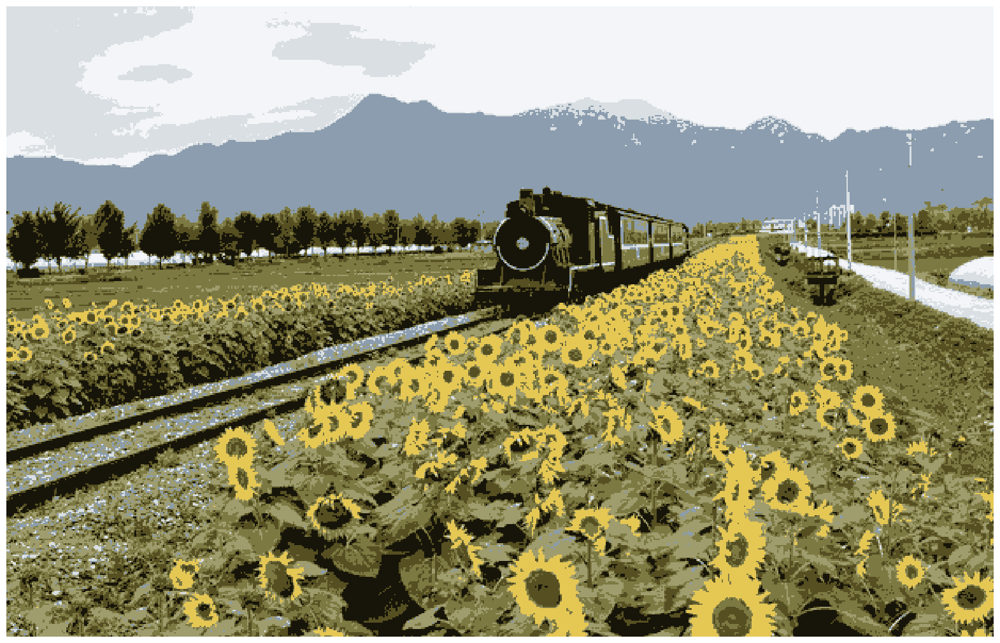

In [24]:
from utils import visualize_mean_color_image
visualize_mean_color_image(img, segments)

### 2.2 Color and Position Features (0.5 point)
Another simple feature vector for a pixel is to concatenate its color and position within the image. In other words, for a pixel of color $(r, g, b)$ located at position $(x, y)$ in the image, its feature vector would be $(r, g, b, x, y)$. However, the color and position features may have drastically different ranges; for example each color channel of an image may be in the range $[0, 1)$, while the position of each pixel may have a much wider range. Uneven scaling between different features in the feature vector may cause clustering algorithms to behave poorly.

One way to correct for uneven scaling between different features is to apply some sort of normalization to the feature vector. One of the simplest types of normalization is to force each feature to have zero mean and unit variance.

Implement **`color_position_features`** in `segmentation.py`.

Output segmentation should look like the following:
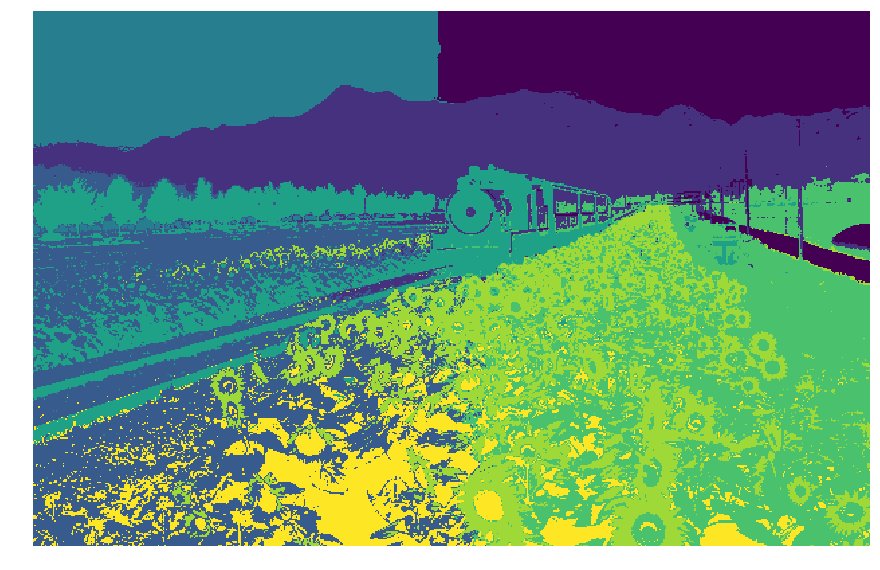

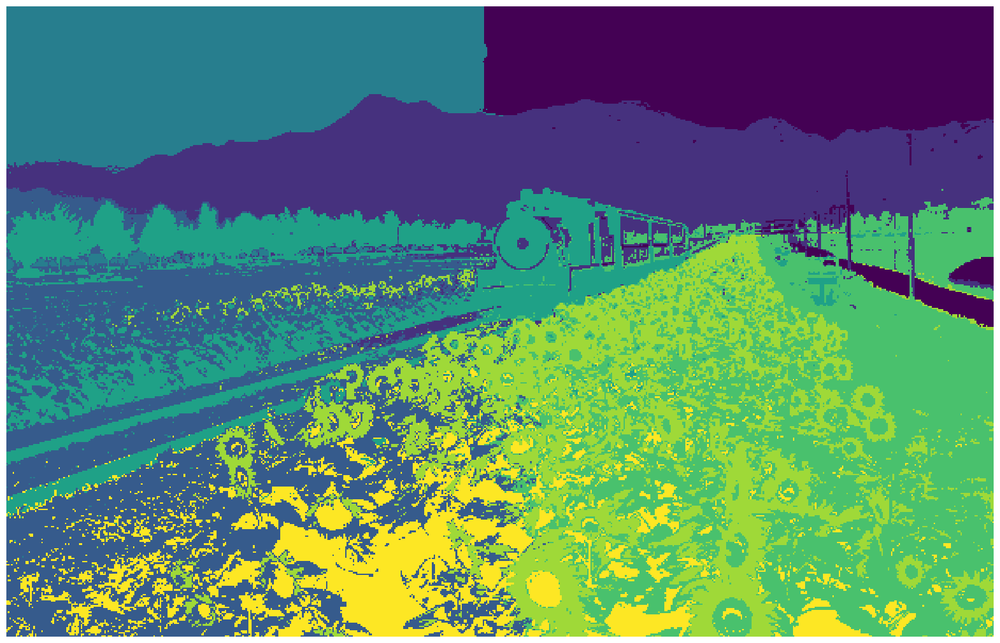

In [25]:
np.random.seed(0)

features = color_position_features(img)

# Sanity checks
assert features.shape == (H * W, C + 2),\
    "Incorrect shape! Check your implementation."

assert features.dtype == np.float64,\
    "dtype of color_features should be float."

assignments = kmeans_fast(features, 8)
segments = assignments.reshape((H, W))

# Display segmentation
plt.imshow(segments, cmap='viridis')
plt.axis('off')
plt.show()

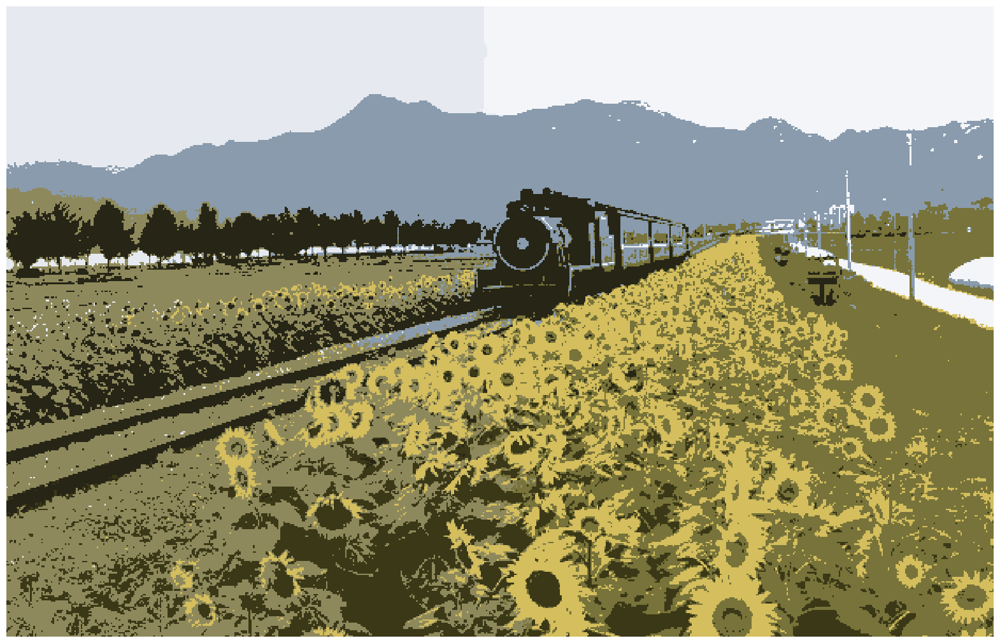

In [26]:
visualize_mean_color_image(img, segments)

## Part 3: Quantitative Evaluation (1 point)

Looking at images is a good way to get an idea for how well an algorithm is working, but the best way to evaluate an algorithm is to have some quantitative measure of its performance.

For this assignment, you were supplied with a small dataset of cat images and ground truth segmentations of these images into foreground (cats) and background (everything else). We will quantitatively evaluate different segmentation methods (features and clustering parameters) on this dataset. Specifically, we need to separate an image into foreground and background regions. Accuracy is the fraction of pixels where the ground truth foreground-background segmentation agrees with the estimated foreground-background segmentation.

(**0.5 point**) Implement **`compute_accuracy`** in `segmentation.py`.

Accuracy: 0.97


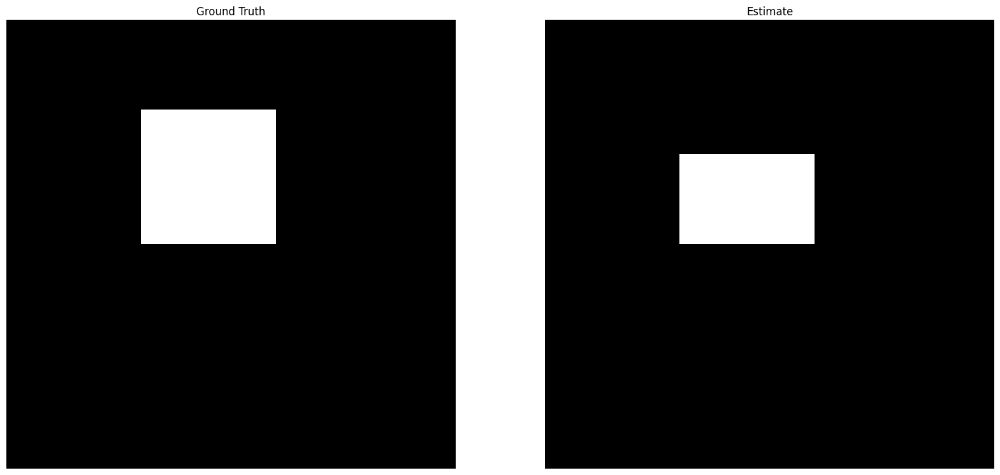

In [27]:
mask_gt = np.zeros((100, 100))
mask = np.zeros((100, 100))

# Test compute_accracy function
mask_gt[20:50, 30:60] = 1
mask[30:50, 30:60] = 1

accuracy = compute_accuracy(mask_gt, mask)

print('Accuracy: %0.2f' % (accuracy))
if accuracy != 0.97:
    print('Check your implementation!')

plt.subplot(121)
plt.imshow(mask_gt)
plt.title('Ground Truth')
plt.axis('off')

plt.subplot(122)
plt.imshow(mask)
plt.title('Estimate')
plt.axis('off')

plt.show()

You can use the script below to evaluate a segmentation method’s ability to separate foreground from background on the entire provided dataset. Use this script as a starting point to evaluate a variety of segmentation parameters.

In [28]:
from utils import load_dataset, compute_segmentation

# Load a small segmentation dataset
imgs, gt_masks = load_dataset('./data')

# Set the parameters for segmentation (you may need to change these parameters for evaluating the segmentation performance).
num_segments = 3
clustering_fn = kmeans_fast
feature_fn = color_features
scale = 0.5

mean_accuracy = 0.0

segmentations = []

for i, (img, gt_mask) in enumerate(zip(imgs, gt_masks)):
    # Compute a segmentation for this image
    segments = compute_segmentation(img, num_segments,
                                    clustering_fn=clustering_fn,
                                    feature_fn=feature_fn,
                                    scale=scale)
    
    segmentations.append(segments)
    
    # Evaluate segmentation
    accuracy = evaluate_segmentation(gt_mask, segments)
    
    print('Accuracy for image %d: %0.4f' %(i, accuracy))
    mean_accuracy += accuracy
    
mean_accuracy = mean_accuracy / len(imgs)
print('Mean accuracy: %0.4f' % mean_accuracy)

Accuracy for image 0: 0.8080
Accuracy for image 1: 0.9586
Accuracy for image 2: 0.9739
Accuracy for image 3: 0.9056
Accuracy for image 4: 0.9601
Accuracy for image 5: 0.6871
Accuracy for image 6: 0.6730
Accuracy for image 7: 0.6705
Accuracy for image 8: 0.8402
Accuracy for image 9: 0.9528
Accuracy for image 10: 0.8634
Accuracy for image 11: 0.8116
Accuracy for image 12: 0.7313
Accuracy for image 13: 0.6605
Accuracy for image 14: 0.7462
Accuracy for image 15: 0.4941
Mean accuracy: 0.7960


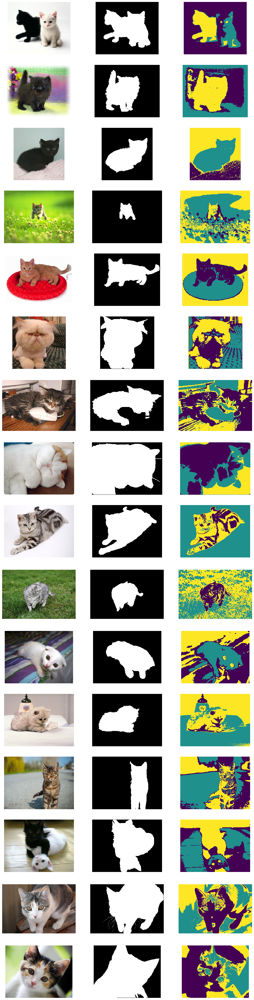

In [29]:
# Visualize segmentation results

N = len(imgs)
plt.figure(figsize=(15,60))
for i in range(N):

    plt.subplot(N, 3, (i * 3) + 1)
    plt.imshow(imgs[i])
    plt.axis('off')

    plt.subplot(N, 3, (i * 3) + 2)
    plt.imshow(gt_masks[i])
    plt.axis('off')

    plt.subplot(N, 3, (i * 3) + 3)
    plt.imshow(segmentations[i], cmap='viridis')
    plt.axis('off')

plt.show()

Accuracy for image 0: 0.8326
Accuracy for image 1: 0.9314
Accuracy for image 2: 0.9837
Accuracy for image 3: 0.5535
Accuracy for image 4: 0.7004
Accuracy for image 5: 0.8643
Accuracy for image 6: 0.5640
Accuracy for image 7: 0.8760
Accuracy for image 8: 0.9093
Accuracy for image 9: 0.9442
Accuracy for image 10: 0.8448
Accuracy for image 11: 0.5860
Accuracy for image 12: 0.6990
Accuracy for image 13: 0.6449
Accuracy for image 14: 0.7753
Accuracy for image 15: 0.5030
Mean accuracy: 0.7633


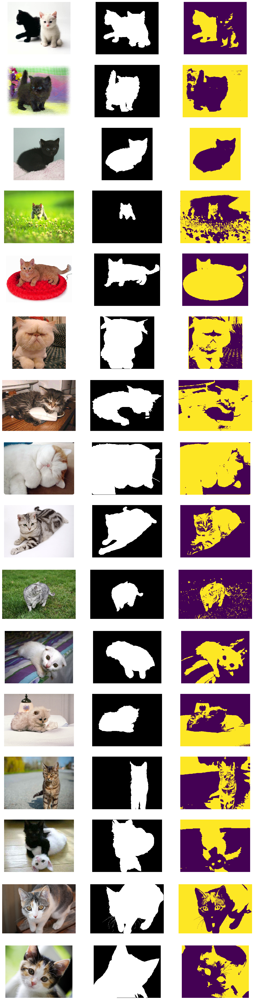

In [30]:
from utils import load_dataset, compute_segmentation

# Load a small segmentation dataset
imgs, gt_masks = load_dataset('./data')

# Set the parameters for segmentation (you may need to change these parameters for evaluating the segmentation performance).
num_segments = 2
clustering_fn = kmeans_fast
feature_fn = color_features
scale = 0.5

mean_accuracy = 0.0

segmentations = []

for i, (img, gt_mask) in enumerate(zip(imgs, gt_masks)):
    # Compute a segmentation for this image
    segments = compute_segmentation(img, num_segments,
                                    clustering_fn=clustering_fn,
                                    feature_fn=feature_fn,
                                    scale=scale)
    
    segmentations.append(segments)
    
    # Evaluate segmentation
    accuracy = evaluate_segmentation(gt_mask, segments)
    
    print('Accuracy for image %d: %0.4f' %(i, accuracy))
    mean_accuracy += accuracy
    
mean_accuracy = mean_accuracy / len(imgs)
print('Mean accuracy: %0.4f' % mean_accuracy)

# Visualize segmentation results

N = len(imgs)
plt.figure(figsize=(15,60))
for i in range(N):

    plt.subplot(N, 3, (i * 3) + 1)
    plt.imshow(imgs[i])
    plt.axis('off')

    plt.subplot(N, 3, (i * 3) + 2)
    plt.imshow(gt_masks[i])
    plt.axis('off')

    plt.subplot(N, 3, (i * 3) + 3)
    plt.imshow(segmentations[i], cmap='viridis')
    plt.axis('off')

plt.show()

Accuracy for image 0: 0.8123
Accuracy for image 1: 0.9412
Accuracy for image 2: 0.9831
Accuracy for image 3: 0.8154
Accuracy for image 4: 0.7000
Accuracy for image 5: 0.6886
Accuracy for image 6: 0.6439
Accuracy for image 7: 0.5770
Accuracy for image 8: 0.9030
Accuracy for image 9: 0.9377
Accuracy for image 10: 0.8770
Accuracy for image 11: 0.7312
Accuracy for image 12: 0.7215
Accuracy for image 13: 0.6631
Accuracy for image 14: 0.7569
Accuracy for image 15: 0.6301
Mean accuracy: 0.7739


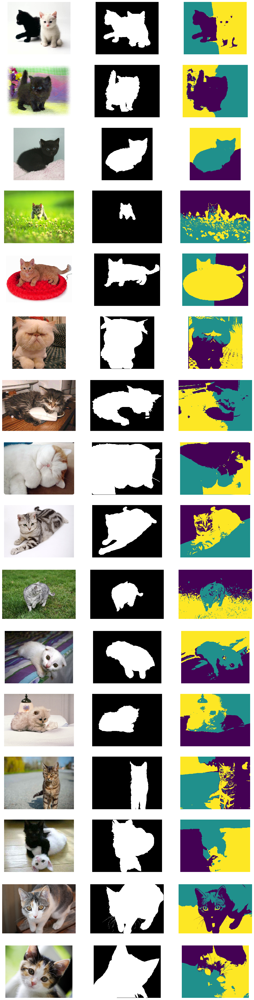

In [31]:
from utils import load_dataset, compute_segmentation

# Load a small segmentation dataset
imgs, gt_masks = load_dataset('./data')

# Set the parameters for segmentation (you may need to change these parameters for evaluating the segmentation performance).
num_segments = 3
clustering_fn = kmeans_fast
feature_fn = color_position_features
scale = 0.5

mean_accuracy = 0.0

segmentations = []

for i, (img, gt_mask) in enumerate(zip(imgs, gt_masks)):
    # Compute a segmentation for this image
    segments = compute_segmentation(img, num_segments,
                                    clustering_fn=clustering_fn,
                                    feature_fn=feature_fn,
                                    scale=scale)
    
    segmentations.append(segments)
    
    # Evaluate segmentation
    accuracy = evaluate_segmentation(gt_mask, segments)
    
    print('Accuracy for image %d: %0.4f' %(i, accuracy))
    mean_accuracy += accuracy
    
mean_accuracy = mean_accuracy / len(imgs)
print('Mean accuracy: %0.4f' % mean_accuracy)

# Visualize segmentation results

N = len(imgs)
plt.figure(figsize=(15,60))
for i in range(N):

    plt.subplot(N, 3, (i * 3) + 1)
    plt.imshow(imgs[i])
    plt.axis('off')

    plt.subplot(N, 3, (i * 3) + 2)
    plt.imshow(gt_masks[i])
    plt.axis('off')

    plt.subplot(N, 3, (i * 3) + 3)
    plt.imshow(segmentations[i], cmap='viridis')
    plt.axis('off')

plt.show()

Accuracy for image 0: 0.8207
Accuracy for image 1: 0.9046
Accuracy for image 2: 0.9833
Accuracy for image 3: 0.6061
Accuracy for image 4: 0.6987
Accuracy for image 5: 0.8731
Accuracy for image 6: 0.5760
Accuracy for image 7: 0.8671
Accuracy for image 8: 0.8994
Accuracy for image 9: 0.5420
Accuracy for image 10: 0.8426
Accuracy for image 11: 0.6052
Accuracy for image 12: 0.5608
Accuracy for image 13: 0.6540
Accuracy for image 14: 0.7746
Accuracy for image 15: 0.5079
Mean accuracy: 0.7322


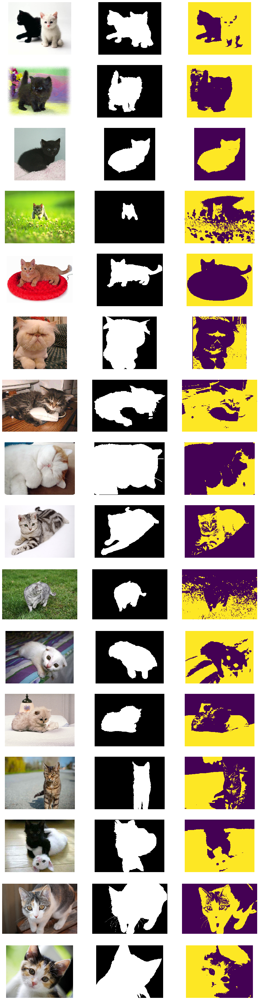

In [15]:
from utils import load_dataset, compute_segmentation

# Load a small segmentation dataset
imgs, gt_masks = load_dataset('./data')

# Set the parameters for segmentation (you may need to change these parameters for evaluating the segmentation performance).
num_segments = 2
clustering_fn = kmeans_fast
feature_fn = color_position_features
scale = 0.5

mean_accuracy = 0.0

segmentations = []

for i, (img, gt_mask) in enumerate(zip(imgs, gt_masks)):
    # Compute a segmentation for this image
    segments = compute_segmentation(img, num_segments,
                                    clustering_fn=clustering_fn,
                                    feature_fn=feature_fn,
                                    scale=scale)
    
    segmentations.append(segments)
    
    # Evaluate segmentation
    accuracy = evaluate_segmentation(gt_mask, segments)
    
    print('Accuracy for image %d: %0.4f' %(i, accuracy))
    mean_accuracy += accuracy
    
mean_accuracy = mean_accuracy / len(imgs)
print('Mean accuracy: %0.4f' % mean_accuracy)

# Visualize segmentation results

N = len(imgs)
plt.figure(figsize=(15,60))
for i in range(N):

    plt.subplot(N, 3, (i * 3) + 1)
    plt.imshow(imgs[i])
    plt.axis('off')

    plt.subplot(N, 3, (i * 3) + 2)
    plt.imshow(gt_masks[i])
    plt.axis('off')

    plt.subplot(N, 3, (i * 3) + 3)
    plt.imshow(segmentations[i], cmap='viridis')
    plt.axis('off')

plt.show()

Accuracy for image 0: 0.8118
Accuracy for image 1: 0.9180
Accuracy for image 2: 0.9838
Accuracy for image 3: 0.7214
Accuracy for image 4: 0.7050
Accuracy for image 5: 0.6756
Accuracy for image 6: 0.6444
Accuracy for image 7: 0.5768
Accuracy for image 8: 0.8874
Accuracy for image 9: 0.9503
Accuracy for image 10: 0.8525
Accuracy for image 11: 0.8028
Accuracy for image 12: 0.7392
Accuracy for image 13: 0.6624
Accuracy for image 14: 0.7538
Accuracy for image 15: 0.6196
Mean accuracy: 0.7691


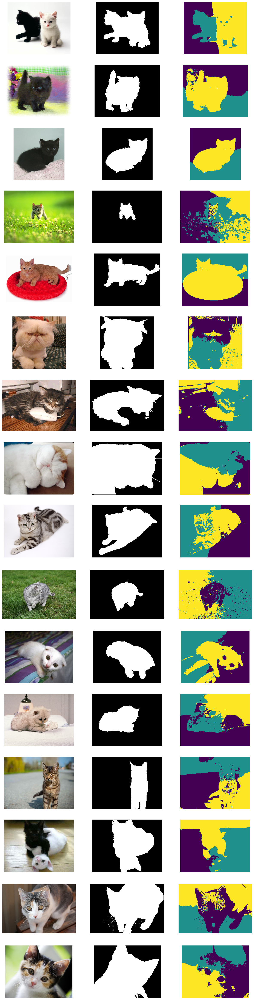

In [32]:
from utils import load_dataset, compute_segmentation

# Load a small segmentation dataset
imgs, gt_masks = load_dataset('./data')

# Set the parameters for segmentation (you may need to change these parameters for evaluating the segmentation performance).
num_segments = 3
clustering_fn = kmeans_fast
feature_fn = color_position_features
scale = 0.7

mean_accuracy = 0.0

segmentations = []

for i, (img, gt_mask) in enumerate(zip(imgs, gt_masks)):
    # Compute a segmentation for this image
    segments = compute_segmentation(img, num_segments,
                                    clustering_fn=clustering_fn,
                                    feature_fn=feature_fn,
                                    scale=scale)
    
    segmentations.append(segments)
    
    # Evaluate segmentation
    accuracy = evaluate_segmentation(gt_mask, segments)
    
    print('Accuracy for image %d: %0.4f' %(i, accuracy))
    mean_accuracy += accuracy
    
mean_accuracy = mean_accuracy / len(imgs)
print('Mean accuracy: %0.4f' % mean_accuracy)

# Visualize segmentation results

N = len(imgs)
plt.figure(figsize=(15,60))
for i in range(N):

    plt.subplot(N, 3, (i * 3) + 1)
    plt.imshow(imgs[i])
    plt.axis('off')

    plt.subplot(N, 3, (i * 3) + 2)
    plt.imshow(gt_masks[i])
    plt.axis('off')

    plt.subplot(N, 3, (i * 3) + 3)
    plt.imshow(segmentations[i], cmap='viridis')
    plt.axis('off')

plt.show()

Include a detailed evaluation of the effect of varying segmentation parameters, i.e., feature type (color or color+position), number of clusters, and scale on the mean accuracy of foreground-background segmentations on the provided dataset. You should test a minimum of 5 combinations of parameters. To present your results, add rows to the table below (you may delete the first row, which is just an example).

 <table style="width:100%">
  <tr>
    <th>Feature Type</th>
    <th>Number of segments</th>
    <th>Scale</th>
    <th>Mean Accuracy</th>
  </tr>
  <tr>
    <td>Color</td>
    <td>3</td>
    <td>0.5</td>
    <td>0.7924</td>
  </tr>
  <tr>
    <td>Color</td>
    <td>2</td>
    <td>0.5</td>
    <td>0.7632</td>
  </tr>
  <tr>
    <td>Color+Position</td>
    <td>3</td>
    <td>0.5</td>
    <td>0.7738</td>
  </tr>
    <tr>
    <td>Color+Position</td>
    <td>2</td>
    <td>0.5</td>
    <td>0.7322</td>
  </tr>
  <tr>
    <td>Color+Position</td>
    <td>3</td>
    <td>0.7</td>
    <td>0.7718</td>
  </tr>

</table> 

(**0.5 point**) Observe your results carefully and try to answer the following question:
1. Based on your quantitative experiments, how do each of the segmentation parameters affect the quality of the final foreground-background segmentation?
2. Are some images simply more difficult to segment correctly than others? If so, what are the qualities of these images that cause the segmentation algorithms to perform poorly?
3. Also feel free to point out or discuss any other interesting observations that you made.

Write your analysis in the cell below.

# **Your answer here**:...
1. The quality would improve as the number of segments increased. It appears that the position feature is ineffective. The table shows that as the scale becomes larger or less than 0.5, the quality or accuracy decreases. Additionally, the performance itself slowed down as the scale and number of segments increased.

2. Pictures with many colors and with different objects might be challenging to categorize. Seems like every color is assumed as another object. Large pictures also have low accuracy, because it takes mojority of the screen. It is relatively easy to learn object when it is located at the center of the image. Also, it is interesting that blurred pictures show low accuracy while nowadays portraid modes on Iphone specially blurres everythinig around to make your face more recognizable.

**Credit**: Juan Carlos Niebles and Ranjay Krishna